> Created on Sun Jan 17 09:46:23 2021 @author: Richie Bao-Chicago.IIT

# Guide to the knowledge structure of th digital LAUPArchi design
## 1.Before and after 2010

> *It does not matter what tools you use, as long as it is a good design or planning.*

### 1.1 In the era of handcraft

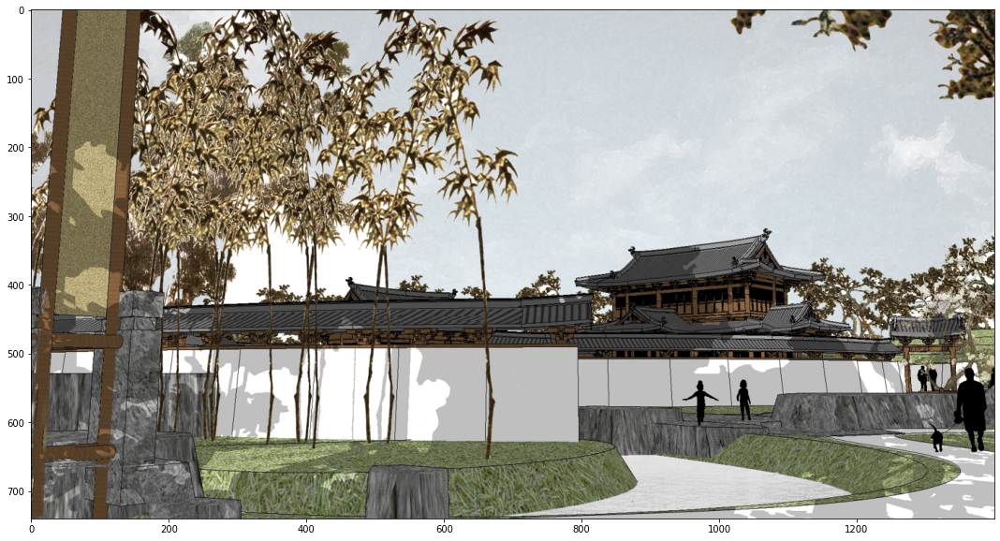

In [75]:
def imgs_slideShow(imgs_fp,suffix=r'jpg',scale=0.7):
    from PIL import Image
    import glob
    import numpy as np
    from tqdm.auto import tqdm
    
    import matplotlib.pyplot as plt
    import matplotlib.animation as animation    
    '''
    function - To dynamically show the images in a specified folder.
    '''   
    imgs_f=glob.glob(imgs_fp+'/*.'+suffix)
    #print(imgs_f)
    imgs=[Image.open(i) for i in imgs_f]
    img_resize=lambda img:img.resize([int(scale * s) for s in img.size] ) 
    imgs_resize=[img_resize(i) for i in imgs]
          
    fig=plt.figure(figsize=(20,10))
    ims=[[plt.imshow(f,animated=True,)] for f in imgs_resize]    
    anima=animation.ArtistAnimation(fig,ims,interval=1000, blit=True,repeat_delay=1000)
    return anima,ims
    
ancient_buildings_fp=r'.\imgs\ancientArhi_perspective'
anima,ims=imgs_slideShow(ancient_buildings_fp)

from IPython.display import HTML
HTML(anima.to_html5_video())

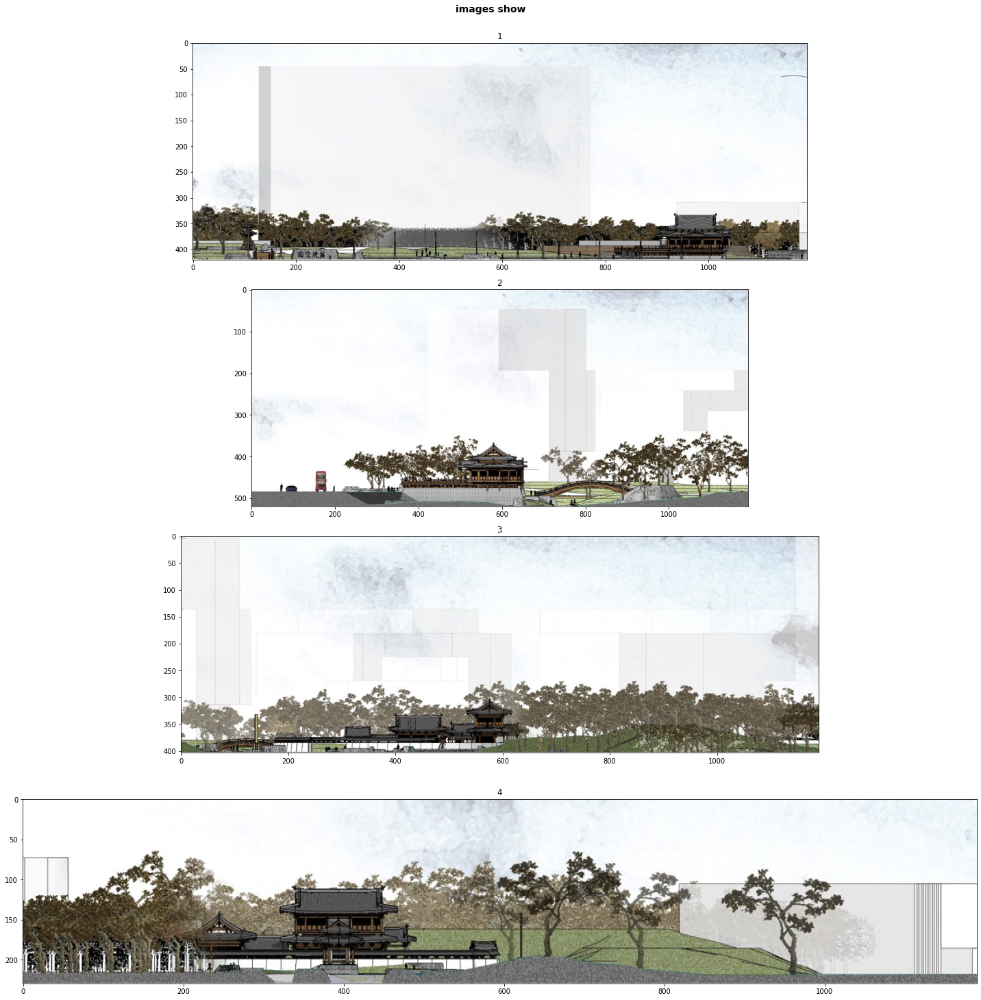

In [76]:
import utils
imgs_fn=utils.filePath_extraction(r'.\imgs\ancientArchi_section',["jpg"]) 
imgs_root=list(imgs_fn.keys())[0]
imgsFn_lst=imgs_fn[imgs_root]
columns=1
scale=1
utils.imgs_layoutShow(imgs_root,imgsFn_lst,columns,scale,figsize=(20,20))

### 1.2 In the era of parametric design

> *Designers have gone from being tool users to tool makers.*

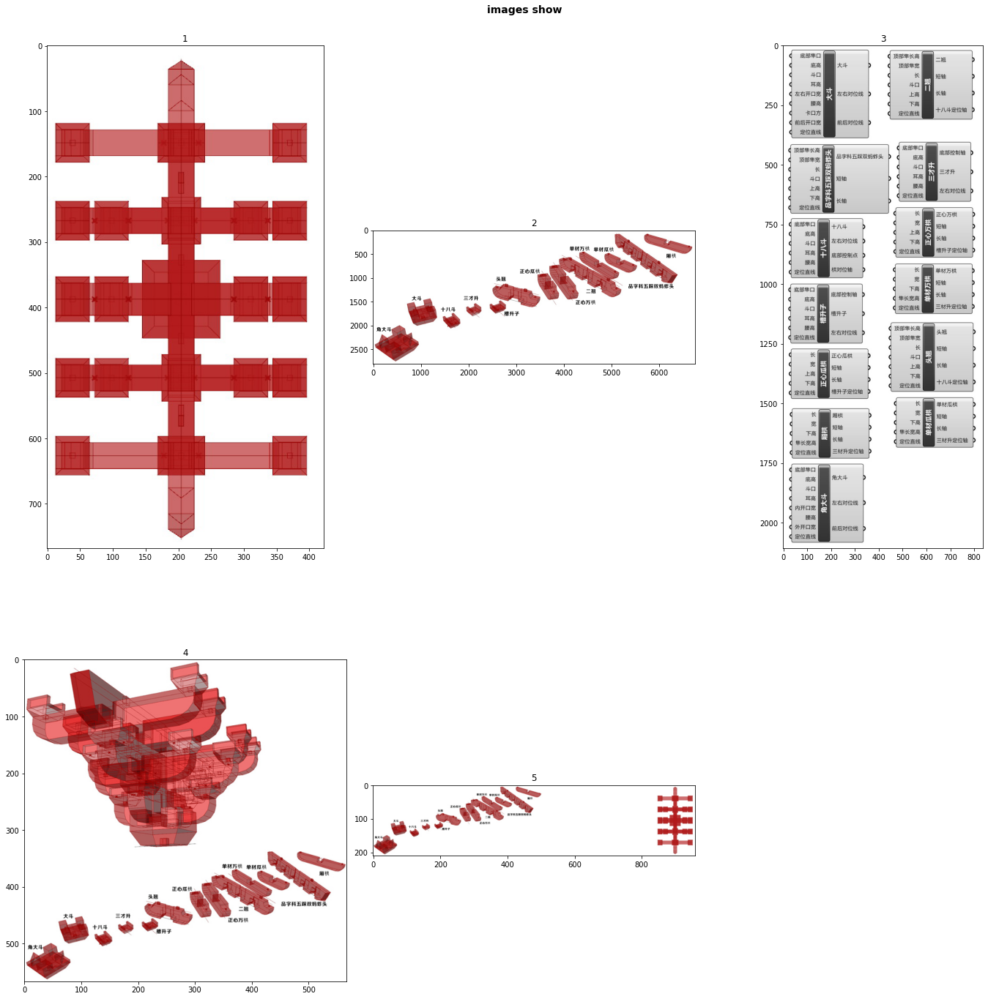

In [77]:
import glob
import utils
imgs_dougong_fps=glob.glob(r'.\code\12_DouGong(Qing)\*.jpg')
columns=3;scale=1
utils.imgs_layoutShow_FPList(imgs_dougong_fps,columns,scale,figsize=(20,20))

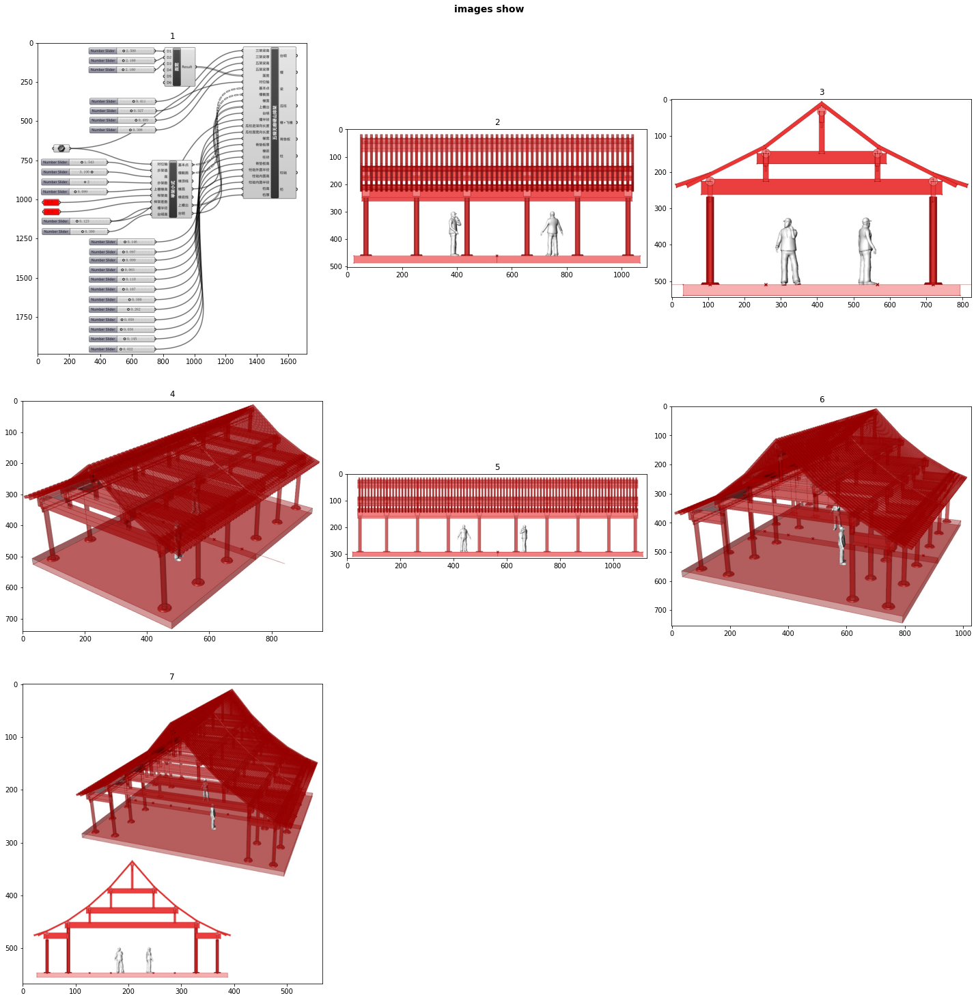

In [78]:
import glob
import utils
imgs_dougong_fps=glob.glob(r'.\code\11_AncientArchi\*.jpg')
columns=3;scale=1
utils.imgs_layoutShow_FPList(imgs_dougong_fps,columns,scale,figsize=(20,20))

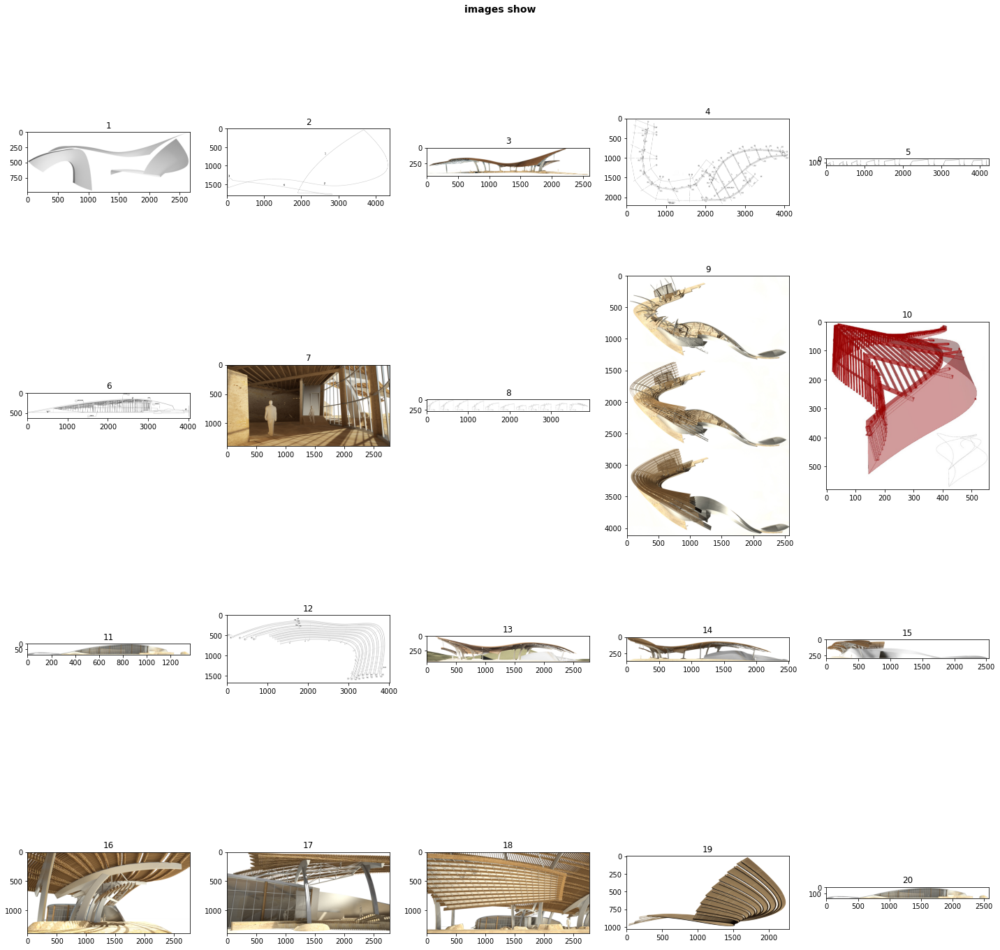

In [79]:
def get_multipleFiletypes_fps_list(files_root,suffix=['jpg','png']):
    import os
    import glob
    '''
    function - Returns a list of file paths from a folder that specified multiple file types. 
    '''    
    exts=['*.{}'.format(i) for i in suffix]
    file_paths=[f for ext in exts for f in glob.glob(os.path.join(files_root, ext))]
    return file_paths

imgs_fish_root=r'.\code\44_architecture_fish'
imgs_fish_fps=get_multipleFiletypes_fps_list(files_root=imgs_fish_root,suffix=['jpg','png'])

columns=5;scale=1
utils.imgs_layoutShow_FPList(imgs_fish_fps,columns,scale,figsize=(20,20))

In [73]:
video_root=r'./video'
video_fps=get_multipleFiletypes_fps_list(files_root=video_root,suffix=['mp4'])
video_dic={os.path.splitext(os.path.basename(v))[-2]:v for v in video_fps}
print("files info:\n")
import pandas as pd
print(pd.DataFrame.from_dict(video_dic,orient='index'))

files info:

                                                                                               0
01_Terrain design                                                  ./video\01_Terrain design.mp4
02_Box flattened                                                    ./video\02_Box flattened.mp4
03_Terrain correlation and costing path        ./video\03_Terrain correlation and costing pat...
05_Hongqiao Evolutionary computation method    ./video\05_Hongqiao Evolutionary computation m...
06_Plant community patch and species planning  ./video\06_Plant community patch and species p...
08_Folding Architecture Concept                      ./video\08_Folding Architecture Concept.mp4


In [74]:
from IPython.display import Video
Video(video_dic['01_Terrain design'])

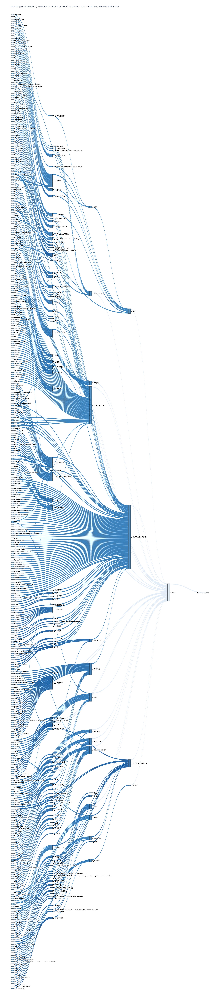

In [11]:
def Sankey(material_yaml_path,title_text,html_savePath,font_size=10,height=7000,): #font_size=10,height=7000    
    import yaml,random,copy
    import numpy as np
    import pandas as pd
    import matplotlib.pyplot as plt
    from collections import OrderedDict
    cmaps=OrderedDict()
    
    '''
    function - 读取自定义的.yaml文件，建立桑基图（Sankey diagram）
    
    Paras:
    material_yaml_path - 数据文件路径
    title_text - 桑基图标题
    html_savePath - 桑基图保存为html文件路径
    font_size=10 - 图表字体大小
    height=7000 - 图表高度       
    '''
    
    #initialize parameters
    material_yaml_path=material_yaml_path
    title_text=title_text
    font_size=font_size
    height=height
    html_savePath=html_savePath

    with open(material_yaml_path,encoding='utf-8') as file:
        materials=yaml.safe_load(file)

    cmaps['Sequential']=['Greys', 'Purples', 'Blues', 'Greens', 'Oranges', 'Reds','YlOrBr', 'YlOrRd', 'OrRd', 'PuRd', 'RdPu', 'BuPu','GnBu', 'PuBu', 'YlGnBu', 'PuBuGn', 'BuGn', 'YlGn']
    classification=materials['mapping']['classification']
    classification_level_1=classification.keys()
    #classification_level_2=classification.values()
    cmaps_sequential=list(cmaps.values())[0]
    random.shuffle(cmaps_sequential)
    classification_level_1_colorSequential={k:v for k,v in zip(classification_level_1,cmaps_sequential[:len(classification_level_1)])}
    classification_level_1_color={key:list(plt.cm.get_cmap(v)(0))[:3]+[0.8] for key,v in classification_level_1_colorSequential.items()} #configure level_1 color
    classification_level_2_color={}
    for k,v in classification.items():
        classification_level_2_color.update({i:list(plt.cm.get_cmap(classification_level_1_colorSequential[k])(c_v)[:3])+[0.8] for i,c_v in zip(v,np.linspace(0.1,0.9,len(v)))}) #configure leve_2 color

    materials_data=pd.DataFrame([dic['data'] for dic in materials['materials'] if dic['data'][0]!=''],columns=['name','date','case','international','source'])    
    materials_data['color']=materials_data.source.apply(lambda row:{0:[31, 119, 180, 0.8],1:[255, 127, 14, 0.8],2:[44, 160, 44, 0.8],3:[214, 39, 40, 0.8],4:[148, 103, 189, 0.8],5:[140, 86, 75, 0.8]}[row])    

    flatten_lst=lambda lst: [m for n_lst in lst for m in flatten_lst(n_lst)] if type(lst) is list else [lst]
    label_idx={v:idx for idx,v in enumerate(flatten_lst(list(classification.values()))+list(classification.keys())+materials_data.name.to_list())}
    node_label=label_idx.keys()

    classification_level_1_color_255={k:[round(i*255) for i in v[:3]]+[v[-1]] for k,v in classification_level_1_color.items()}
    classification_level_2_color_255={k:[round(i*255) for i in v[:3]]+[v[-1]] for k,v in classification_level_2_color.items()}
    classification_color=copy.deepcopy(classification_level_1_color_255)
    classification_color.update(classification_level_2_color_255)
    classification_color.update({row['name']:row['color'] for idx,row in materials_data[['name','color']].iterrows()})
    node_color=[classification_color[label] for label in node_label]
    node_color_rgba=["rgba(%d,%d,%d,%.1f)"%(r,g,b,a) for r,g,b,a in node_color]

    link_data_=[]
    for dic in materials['materials']:
        if dic['data'][0]!='':
            link_data_.append([(dic['data'][0],link) for link in dic['link']])
    link_data=flatten_lst(link_data_)
    link_classification=flatten_lst([[(i,k) for i in v] for k,v in classification.items()])

    classification_sub=materials['mapping']['classification_sub']
    link_classification_sub=flatten_lst([[(i,k) for i in v] for k,v in classification_sub.items()])

    link_S_T=link_data+link_classification_sub #+link_classification

    link_source=[label_idx[s] for s,t in link_S_T]
    link_target=[label_idx[t] for s,t in link_S_T]

    link_num=len(link_S_T)
    link_value=[1]*link_num #further adjust
    opacity = 0.9
    link_color_rgba=[node_color_rgba[src].replace("0.8", str(opacity)) for src in link_target]
    link_label=[""]*link_num

    import plotly.graph_objects as go
    fig = go.Figure(data=[go.Sankey(
        valueformat = ".0f",
        valuesuffix = "TWh",
        # Define nodes
        node = dict(
          pad = 20,
          thickness = 15,
          line = dict(color = "black", width = 0.5),
          label=list(label_idx.keys()),
          color=node_color_rgba
        ),
        #domain=dict(column= ),
        # Add links
        link = dict(
          source=link_source,
          target=link_target,
          value=link_value,
          label=link_label,
          color=link_color_rgba
    ))])

    fig.update_layout(title_text=title_text,font_size=font_size,height=height) #fig.update_layout(title_text="参数化研究内容关联 <a href=''>link</a>",font_size=10)
    fig.show()
    fig.write_html("%s"%html_savePath)

material_yaml_path=r'./data/materials.yaml'    
title_text=r"Grasshopper App(add-on),) content correlation _Created on Sat Oct  3 21:18:36 2020 @author:Richie Bao"
font_size=10
height=7000
html_savePath=r"./html/Parameterized overview chart.html"
Sankey(material_yaml_path,title_text=title_text,html_savePath=html_savePath,font_size=font_size,height=height)   #Sankey(material_yaml_path,html_savePath,font_size,height)  

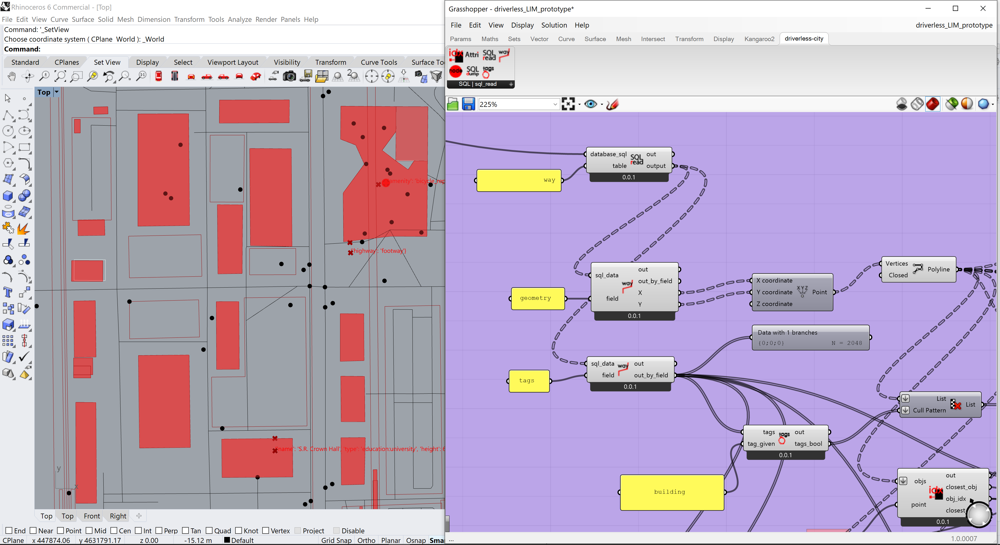

In [84]:
import matplotlib.pyplot as plt
from PIL import Image

img_LIM_fp=r'./imgs/misc/LIM.png'
img_LIM=Image.open(img_LIM_fp)
img_LIM

## 2.Coding in the present and future
